In [1]:
import numpy as np
import pandas as pd
from collections import defaultdict, Counter
import networkx as nx
from matplotlib import pyplot as plt

In [2]:
data = pd.read_csv("human_phosphorylations_12_12_21.tsv", sep='\t')

In [3]:
data.head()

,ENTITYA,TYPEA,IDA,DATABASEA,ENTITYB,TYPEB,IDB,DATABASEB,EFFECT,MECHANISM,...,MODASEQ,MODIFICATIONB,MODBSEQ,PMID,DIRECT,NOTES,ANNOTATOR,SENTENCE,SCORE,SIGNOR_ID
0,PRKACA,protein,P17612,UNIPROT,MBP,protein,P02686,UNIPROT,unknown,phosphorylation,...,NaN,NaN,NaN,2413024,YES,NaN,miannu,Ser-46 and Ser-151 were specifically phosphory...,0.308,SIGNOR-250011
1,PRKACA,protein,P17612,UNIPROT,MBP,protein,P02686,UNIPROT,unknown,phosphorylation,...,NaN,NaN,NaN,2413024,YES,NaN,miannu,Ser-46 and Ser-151 were specifically phosphory...,0.308,SIGNOR-250012
2,PRKACA,protein,P17612,UNIPROT,MBP,protein,P02686,UNIPROT,unknown,phosphorylation,...,NaN,NaN,NaN,2413024,YES,NaN,miannu,Ser-46 and Ser-151 were specifically phosphory...,0.308,SIGNOR-250013
3,PRKACA,protein,P17612,UNIPROT,MBP,protein,P02686,UNIPROT,unknown,phosphorylation,...,NaN,NaN,NaN,2413024,YES,NaN,miannu,Ser-46 and Ser-151 were specifically phosphory...,0.308,SIGNOR-250014
4,PRKACA,protein,P17612,UNIPROT,MBP,protein,P02686,UNIPROT,unknown,phosphorylation,...,NaN,NaN,NaN,2413024,YES,NaN,miannu,Ser-46 and Ser-151 were specifically phosphory...,0.308,SIGNOR-250015


In [4]:
data.shape

(11305, 28)

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11305 entries, 0 to 11304
Data columns (total 28 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ENTITYA            11305 non-null  object 
 1   TYPEA              11305 non-null  object 
 2   IDA                11305 non-null  object 
 3   DATABASEA          11305 non-null  object 
 4   ENTITYB            11305 non-null  object 
 5   TYPEB              11305 non-null  object 
 6   IDB                11305 non-null  object 
 7   DATABASEB          11305 non-null  object 
 8   EFFECT             11305 non-null  object 
 9   MECHANISM          11305 non-null  object 
 10  RESIDUE            10072 non-null  object 
 11  SEQUENCE           10072 non-null  object 
 12  TAX_ID             11056 non-null  float64
 13  CELL_DATA          4316 non-null   object 
 14  TISSUE_DATA        598 non-null    object 
 15  MODULATOR_COMPLEX  256 non-null    object 
 16  TARGET_COMPLEX     129

In [6]:
data.iloc[0]

ENTITYA                                                         PRKACA
TYPEA                                                          protein
IDA                                                             P17612
DATABASEA                                                      UNIPROT
ENTITYB                                                            MBP
TYPEB                                                          protein
IDB                                                             P02686
DATABASEB                                                      UNIPROT
EFFECT                                                         unknown
MECHANISM                                              phosphorylation
RESIDUE                                                         Ser146
SEQUENCE                                               RPSQRHGsKYLATAS
TAX_ID                                                              -1
CELL_DATA                                                          NaN
TISSUE

In [7]:
threeToOne = {'ala' : 'A', 'arg' : 'R', 'asn' : 'N', 'asp' : 'D', 'cys' : 'C', 'glu' : 'E','gln' : 'Q',
              'gly' : 'G', 'his' : 'H', 'ile' : 'I', 'leu' : 'L', 'lys' : 'K','met' : 'M', 'phe' : 'F',
              'pro' : 'P', 'ser' : 'S', 'thr' : 'T', 'trp' : 'W', 'tyr' : 'Y', 'val' : 'V'}

In [8]:
Target, Position, Residue, Kinase = [], [], [], []

In [9]:
for i in range(data.shape[0]):
    r = data.iloc[i]
    res = r.RESIDUE
    if res == res and len(res.split(';')) == 1:
        if r.MECHANISM=="phosphorylation" and r.DIRECT=="YES":
            Target.append(r.ENTITYB)
            Kinase.append(r.ENTITYA)
            Residue.append(threeToOne[res[:3].lower()])
            Position.append(int(res[3:]))
            
    elif res == res and len(res.split(';')) > 1:
        if r.MECHANISM=="phosphorylation" and r.DIRECT=="YES":
            Target.append(r.ENTITYB)
            Kinase.append(r.ENTITYA)
            res = res.split(';')[0]
            Residue.append(threeToOne[res[:3].lower()])
            Position.append(int(res[3:]))

In [10]:
print(len(Target), len(Position), len(Residue), len(Kinase))

9165 9165 9165 9165


In [11]:
processed_data = pd.DataFrame({'Target' : Target,
                              'Position' : Position,
                              'Residue' : Residue,
                              'Kinase' : Kinase})

In [12]:
processed_data

,Target,Position,Residue,Kinase
0,MBP,146,S,PRKACA
1,MBP,190,S,PRKACA
2,MBP,266,S,PRKACA
3,MBP,295,S,PRKACA
4,MBP,169,T,PRKACA
...,...,...,...,...
9160,HAND1,107,T,PRKACA
9161,HAND1,98,S,PRKACA
9162,FOS,362,S,PRKACA
9163,MBP,141,S,PRKACA


In [13]:
kinase = list(set(processed_data['Kinase']))
print(len(kinase))
print(kinase)

426
['LIMK1', 'TBK1', 'IKK-complex', 'PTK2B', 'SMG1', 'CAMK4', 'RPS6KB2', 'RIOK3', 'CAMK1G', 'MAPK13', 'PTK2', 'TP53RK', 'GRK1', 'CSNK1E', 'TTBK1', 'ULK2', 'MEK1/2', 'SRC', 'PLK3', 'PRPF4B', 'CyclinD/CDK4', 'MKNK2', 'CHUK', 'NEK1', 'CDK5RAP2', 'RPS6K', 'MAPKAPK5', 'MAP2K3', 'NME1', 'UHMK1', 'TNIK', 'PKMYT1', 'MARK1', 'CHEK1', 'MYLK2', 'FYN', 'EPHA8', 'KSR1', 'WNK1', 'PAK2', 'PRKAA1', 'FAM20C', 'LCK', 'MAPK1', 'MINK1', 'VRK3', 'MAP3K8', 'NEK3', 'CDK5', 'PRKCZ', 'BAZ1B', 'AKT', 'PRKCB', 'ZAP70', 'MST1', 'PRKG2', 'Gbeta', 'PRKCG', 'CDK20', 'PNCK', 'IRAK4', 'MAPK11', 'PAK4', 'CDK9', 'CLK4', 'JAK2', 'CDK11B', 'KRAS', 'MYLK3', 'CyclinE/CDK2', 'WNK2', 'FES', 'TAOK3', 'DYRK2', 'CDC42BPB', 'TLK1', 'PIM3', 'AKT1', 'NEK2', 'PIK3CA', 'RPS6KA2', 'PLCG2', 'MELK', 'Membrane_blebbing', 'MAPK7', 'AKT2', 'TAOK1', 'p38', 'GSK3B/Axin/APC', 'PRKCI', 'PHKG2', 'HIPK2', 'CyclinB/CDK1', 'AURKC', 'mTORC2', 'BRD4', 'MYO3A', 'KHK', 'PRKAR2A', 'PRKD3', 'BTK', 'PRKAB1', 'CSNK1A1', 'RPS6KA1', 'MAPKAPK3', 'BLVRA', 'P

In [14]:
akt = processed_data.loc[processed_data['Target'].apply(lambda x : x == "AKT1")]

In [15]:
df = processed_data[processed_data['Target'].apply(lambda x : x in kinase)]
df

,Target,Position,Residue,Kinase
5,RAF1,259,S,PRKACA
6,RAF1,43,S,PRKACA
7,RAF1,621,S,PRKACA
8,ERBB2,686,T,PRKACA
9,RET,696,S,PRKACA
...,...,...,...,...
9098,PRKD1,742,S,PRKCA
9127,RPS6KB2,473,S,PRKCA
9140,EEF2K,366,S,PRKACA
9141,EEF2K,500,S,PRKACA


In [16]:
nodes = list(set(df.Kinase).union(set(df.Target)))
edges = [(x, y) for x, y in zip(df.Kinase, df.Target)]

In [17]:
G = nx.DiGraph()

#G.add_nodes_from(kinase)
G.add_edges_from(edges)

In [18]:
def analyzeNetwork(G):
    print(nx.info(G))
    density = nx.density(G)
    print("Network Density:", density)
    degree = sorted(G.degree(G.nodes), key=lambda x:x[1], reverse=True)
    print("\nTop 10 nodes with more connections with others:\n", degree[:10])
    betweenness = sorted(nx.betweenness_centrality(G).items(), key=lambda x:x[1], reverse=True)
    print("\nTop 10 nodes which most effectively communicate with others:\n", betweenness[:10])
    eigen = sorted(nx.eigenvector_centrality(G).items(), key=lambda x:x[1], reverse=True)
    print("\nTop 10 nodes which most quickly communicate with others:\n", eigen[:10])
    bet, eig = dict(betweenness), dict(eigen)
    important = {k : round(v+eig[k], 4) for k, v in bet.items()}
    less_important = {k : v for k, v in important.items() if v <= 0.0}
    imp = sorted(important.items(), key=lambda x:x[1], reverse=True)
    print("\nTop 10 important nodes :\n", imp[:10])
    return important, less_important

In [19]:
imp, limp = analyzeNetwork(G)

Name: 
Type: DiGraph
Number of nodes: 315
Number of edges: 814
Average in degree:   2.5841
Average out degree:   2.5841
Network Density: 0.008229703771105046

Top 10 nodes with more connections with others:
 [('SRC', 37), ('AKT1', 37), ('AKT', 36), ('MAPK1', 27), ('MAPK3', 26), ('PDPK1', 26), ('PRKACA', 25), ('ABL1', 25), ('STK11', 24), ('GSK3B', 23)]

Top 10 nodes which most effectively communicate with others:
 [('ABL1', 0.05184465570647058), ('MAP2K1', 0.04286994562654233), ('AKT1', 0.042769088686239465), ('MAPK1', 0.038904834458465765), ('SRC', 0.03813055455868069), ('CDK1', 0.03671587714060446), ('AKT', 0.034174865924979925), ('MAPK14', 0.029043835260280867), ('MAPK3', 0.02731528579247322), ('RET', 0.026949384615200984)]

Top 10 nodes which most quickly communicate with others:
 [('GSK3B', 0.32986783582093276), ('RAF1', 0.2774149431400556), ('MAP2K1', 0.2666155788584311), ('EEF2K', 0.2274926421248374), ('EGFR', 0.1920190437793341), ('STK11', 0.16209991208513724), ('CAD', 0.1600322

In [20]:
G.remove_edges_from(nx.selfloop_edges(G))

In [21]:
G.number_of_selfloops()

0

In [22]:
def nodeCalculation(df, imp):
    rc = defaultdict(list)

    for p, q in zip(df['Kinase'], df['Residue']):
        rc[p].append(q)

    for p, q in zip(df['Target'], df['Residue']):
        rc[p].append(q)

    c = {'H':'red', 'S':'lightblue', 'T':'lightgreen', 'Y':'orange'}

    nodelist = list(imp.keys())
    node_size = np.array(list(imp.values()))*10000
    node_color = [c[max(rc[n], key=len)] for n in nodelist]
    
    return nodelist, node_size, node_color

In [23]:
nodelist, node_size, node_color = nodeCalculation(df, imp)

/home/ikraminf/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/home/ikraminf/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


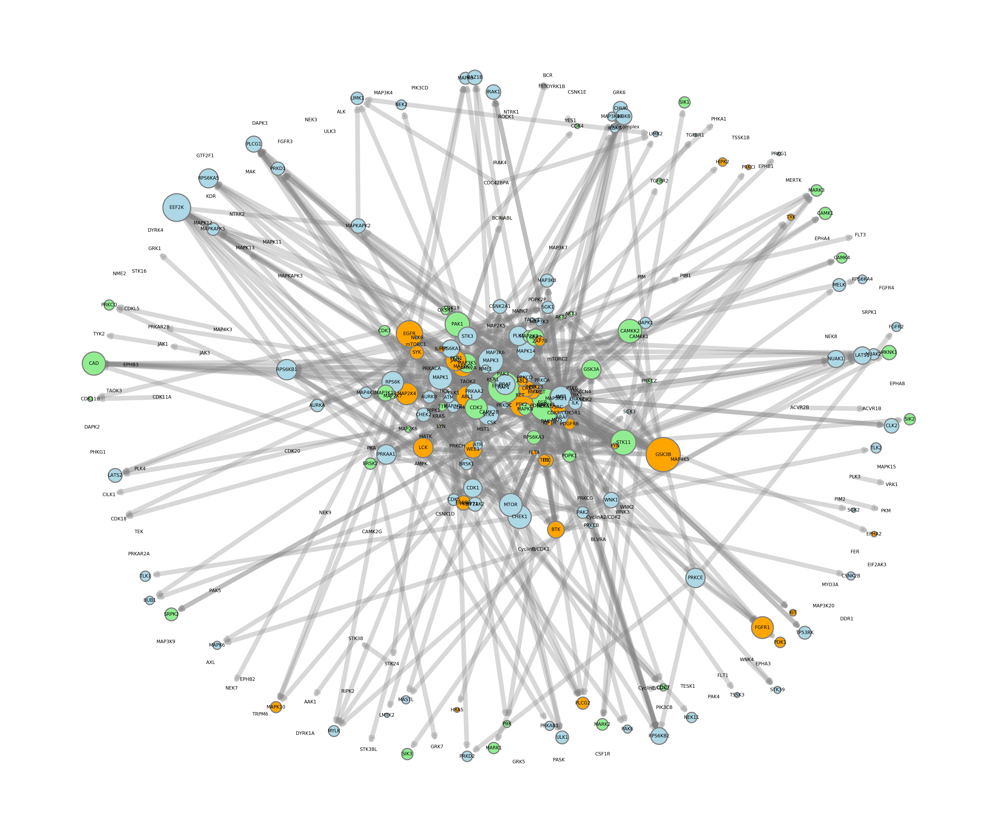

In [24]:
plt.figure(figsize=(24, 20), dpi=300)

pos = nx.spring_layout(G, seed=1)  # positions for all nodes

# nodes
# node color according to residue : (H, red), (S, blue), (T, green), (Y, orange)
nx.draw_networkx_nodes(G, pos, nodelist=nodelist, node_size=node_size, node_color=node_color, \
                       edgecolors='gray', linewidths=2, alpha=1)

# edges
nx.draw_networkx_edges(G, pos, width=8, alpha=0.3, edge_color="grey")

# edge color according to number of edges: (#edges==1,red), (2<=#edges<=10,green), (#edges>10,blue)
#nx.draw_networkx_edges(G, pos, edgelist=a, width=8, alpha=0.5, edge_color="tab:red")
#nx.draw_networkx_edges(G, pos, edgelist=b, width=8, alpha=0.5, edge_color="tab:green")
#nx.draw_networkx_edges(G, pos, edgelist=c, width=8, alpha=0.5, edge_color="tab:blue")

nx.draw_networkx_labels(G, pos, font_size=8, font_color="black")

plt.tight_layout()
plt.axis("off")
plt.show()

In [25]:
degrees = pd.DataFrame(G.degree, columns=['kinase', 'degree'])
degrees = degrees.sort_values('degree', ascending = False)
print(degrees)

     kinase  degree
56     AKT1      37
92      AKT      36
4       SRC      35
0    PRKACA      25
30    MAPK1      25
..      ...     ...
82   DYRK1A       0
55      AXL       0
88   PIK3CB       0
194   PHKG1       0
225   TAOK3       0

[315 rows x 2 columns]


(array([211.,  56.,  25.,   5.,   6.,   4.,   5.,   0.,   0.,   3.]),
 array([ 0. ,  3.7,  7.4, 11.1, 14.8, 18.5, 22.2, 25.9, 29.6, 33.3, 37. ]),
 <a list of 10 Patch objects>)

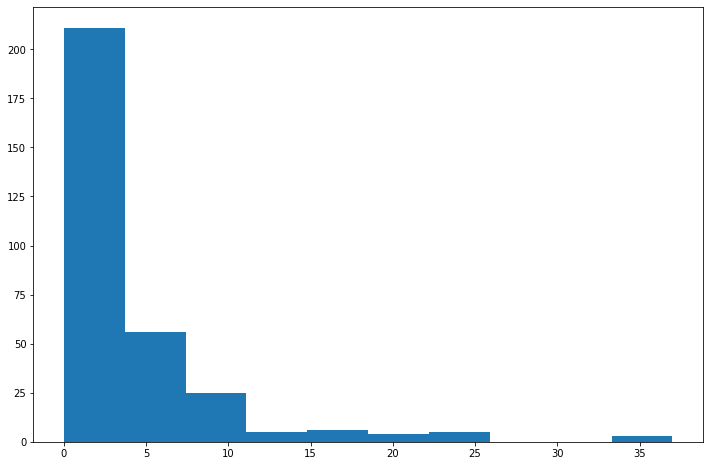

In [26]:
plt.figure(figsize=(12, 8))
plt.hist(degrees.degree)

[55, 68, 59, 29, 18, 11, 14, 13, 7, 7, 5, 6, 2, 0, 3, 2, 1, 2, 1, 1, 0, 2, 1, 1, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]


Text(0, 0.5, 'Frequency')

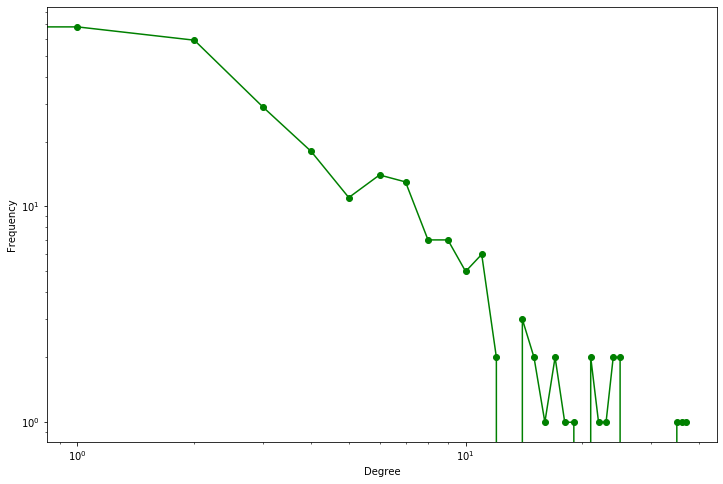

In [27]:
degree_freq = nx.degree_histogram(G)
print(degree_freq)
degrees = range(len(degree_freq))
plt.figure(figsize=(12, 8)) 
plt.loglog(degrees, degree_freq,'go-') 
plt.xlabel('Degree')
plt.ylabel('Frequency')

# Task 4

## (a)

In [28]:
except_mapk1 = df[df['Kinase'].apply(lambda x : x != 'MAPK1')]
except_mapk1

,Target,Position,Residue,Kinase
5,RAF1,259,S,PRKACA
6,RAF1,43,S,PRKACA
7,RAF1,621,S,PRKACA
8,ERBB2,686,T,PRKACA
9,RET,696,S,PRKACA
...,...,...,...,...
9098,PRKD1,742,S,PRKCA
9127,RPS6KB2,473,S,PRKCA
9140,EEF2K,366,S,PRKACA
9141,EEF2K,500,S,PRKACA


In [29]:
mapk1 = nx.DiGraph()

#mapk1.add_edges_from([(x, y) for x, y in zip(except_mapk1.Kinase, except_mapk1.Target)])
mapk1.add_edges_from(edges)

In [30]:
mapk1.remove_edges_from(nx.selfloop_edges(mapk1))

In [31]:
imp, limp = analyzeNetwork(mapk1)

Name: 
Type: DiGraph
Number of nodes: 315
Number of edges: 643
Average in degree:   2.0413
Average out degree:   2.0413
Network Density: 0.006500859367101405

Top 10 nodes with more connections with others:
 [('AKT1', 37), ('AKT', 36), ('SRC', 35), ('PRKACA', 25), ('MAPK1', 25), ('MAPK3', 24), ('PDPK1', 24), ('ABL1', 23), ('STK11', 22), ('GSK3B', 21)]

Top 10 nodes which most effectively communicate with others:
 [('ABL1', 0.05184465570647058), ('MAP2K1', 0.04286994562654233), ('AKT1', 0.042769088686239465), ('MAPK1', 0.038904834458465765), ('SRC', 0.03813055455868069), ('CDK1', 0.03671587714060446), ('AKT', 0.034174865924979925), ('MAPK14', 0.029043835260280867), ('MAPK3', 0.02731528579247322), ('RET', 0.026949384615200984)]

Top 10 nodes which most quickly communicate with others:
 [('GSK3B', 0.30429408084117715), ('MAP2K1', 0.2514601565372069), ('RAF1', 0.24543179184805028), ('EEF2K', 0.2268996230490785), ('EGFR', 0.16965859780069276), ('CHEK1', 0.1504733518156326), ('BRAF', 0.14652

In [32]:
mapk1_edges = [(k, t) for k, t in zip(df.Kinase, df.Target) if k=='MAPK1']
mapk1_nodes = sum(mapk1_edges, ())

# separate nodes from important nodes with values
with_mapk1, without_mapk1 = {}, {}
for k, v in imp.items():
    if k in mapk1_nodes:
        with_mapk1.update({k:v})
    else:
        without_mapk1.update({k:v})
        

# create nodes and define node size
with_nodes = list(with_mapk1.keys())
with_size = np.array(list(with_mapk1.values()))*10000

without_nodes = list(without_mapk1.keys())
without_size = np.array(list(without_mapk1.values()))*10000

In [33]:
#nodelist, node_size, node_color = nodeCalculation(except_mapk1, imp)

/home/ikraminf/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/home/ikraminf/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


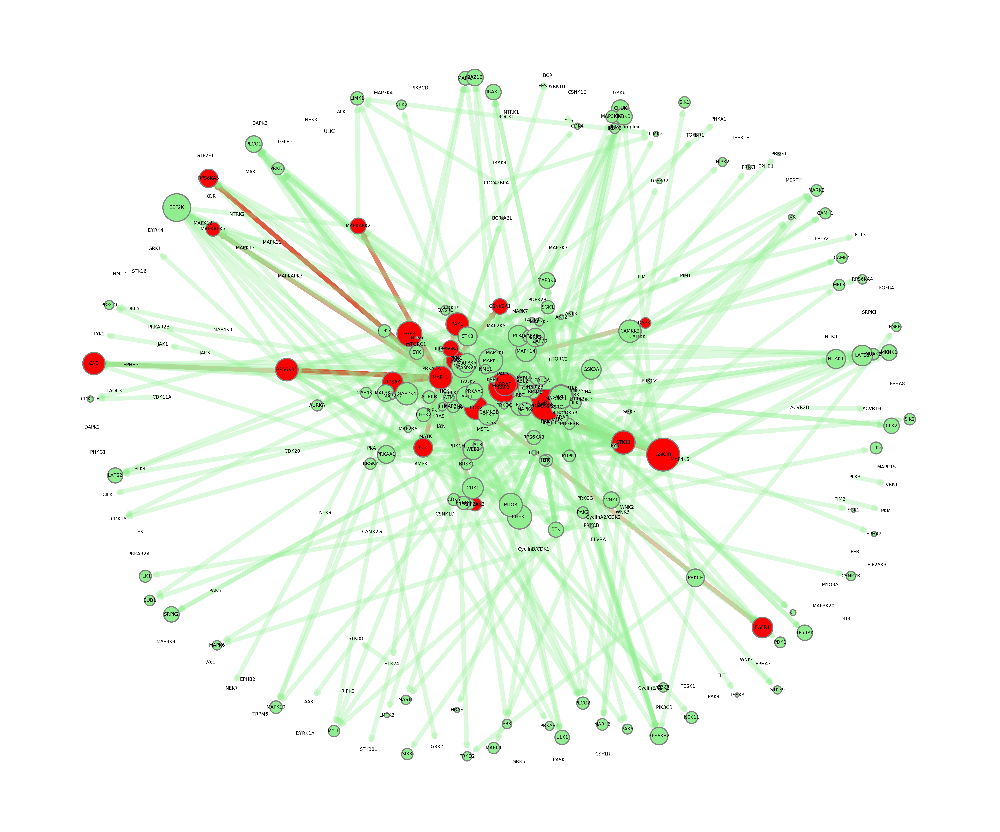

In [34]:
plt.figure(figsize=(24, 20), dpi=300)

pos = nx.spring_layout(mapk1, seed=1)  # positions for all nodes

# nodes
# node color according to residue : (H, red), (S, blue), (T, green), (Y, orange)
nx.draw_networkx_nodes(mapk1, pos, nodelist=with_nodes, node_size=with_size, node_color='red',\
                      edgecolors='gray', linewidths=2, alpha=1)
nx.draw_networkx_nodes(mapk1, pos, nodelist=without_nodes, node_size=without_size, node_color='lightgreen',\
                      edgecolors='gray', linewidths=2, alpha=1)

# edges
nx.draw_networkx_edges(mapk1, pos, edgelist=mapk1_edges, width=8, alpha=0.3, edge_color="red")
nx.draw_networkx_edges(mapk1, pos, width=8, alpha=0.3, edge_color="lightgreen")

# edge color according to number of edges: (#edges==1,red), (2<=#edges<=10,green), (#edges>10,blue)
#nx.draw_networkx_edges(G, pos, edgelist=a, width=8, alpha=0.5, edge_color="tab:red")
#nx.draw_networkx_edges(G, pos, edgelist=b, width=8, alpha=0.5, edge_color="tab:green")
#nx.draw_networkx_edges(G, pos, edgelist=c, width=8, alpha=0.5, edge_color="tab:blue")

nx.draw_networkx_labels(mapk1, pos, font_size=8, font_color="black")

plt.tight_layout()
plt.axis("off")
plt.show()

## (b)

In [35]:
q = df.copy()

In [36]:
edgelist = []

for i, t, k, p, r in zip(q.index, q.Target, q.Kinase, q.Position, q.Residue):
    if t == 'WEE1' and p == 642 and r == 'S':
        q.loc[[i], 'Residue'] = 'Q'
        edgelist.append((k, t))

In [37]:
set(q.Residue)

{'H', 'Q', 'S', 'T', 'Y'}

In [38]:
edgelist

[('BRSK1', 'WEE1')]

In [39]:
n = sum(edgelist, ())
n

('BRSK1', 'WEE1')

In [40]:
wee1 = nx.DiGraph()

#Q.add_nodes_from(nodes)
wee1.add_edges_from(edges)

In [41]:
imp, limp = analyzeNetwork(wee1)

Name: 
Type: DiGraph
Number of nodes: 315
Number of edges: 814
Average in degree:   2.5841
Average out degree:   2.5841
Network Density: 0.008229703771105046

Top 10 nodes with more connections with others:
 [('SRC', 37), ('AKT1', 37), ('AKT', 36), ('MAPK1', 27), ('MAPK3', 26), ('PDPK1', 26), ('PRKACA', 25), ('ABL1', 25), ('STK11', 24), ('GSK3B', 23)]

Top 10 nodes which most effectively communicate with others:
 [('ABL1', 0.05184465570647058), ('MAP2K1', 0.04286994562654233), ('AKT1', 0.042769088686239465), ('MAPK1', 0.038904834458465765), ('SRC', 0.03813055455868069), ('CDK1', 0.03671587714060446), ('AKT', 0.034174865924979925), ('MAPK14', 0.029043835260280867), ('MAPK3', 0.02731528579247322), ('RET', 0.026949384615200984)]

Top 10 nodes which most quickly communicate with others:
 [('GSK3B', 0.32986783582093276), ('RAF1', 0.2774149431400556), ('MAP2K1', 0.2666155788584311), ('EEF2K', 0.2274926421248374), ('EGFR', 0.1920190437793341), ('STK11', 0.16209991208513724), ('CAD', 0.1600322

In [43]:
wee1.remove_edges_from(nx.selfloop_edges(wee1))

In [44]:
#node_size = np.array(list(imp.values()))*10000
#nodelist = list(imp.keys())
#node_color = len(nodelist)*['lightgreen']

In [45]:
wee1_edges = [(k, t) for k, t in zip(df.Kinase, df.Target) if t=='WEE1']
wee1_nodes = sum(wee1_edges, ())

# separate nodes from important nodes with values
with_wee1, without_wee1 = {}, {}
for k, v in imp.items():
    if k in wee1_nodes:
        with_wee1.update({k:v})
    else:
        without_wee1.update({k:v})
        

# create nodes and define node size
with_nodes = list(with_wee1.keys())
with_size = np.array(list(with_wee1.values()))*10000

without_nodes = list(without_wee1.keys())
without_size = np.array(list(without_wee1.values()))*10000

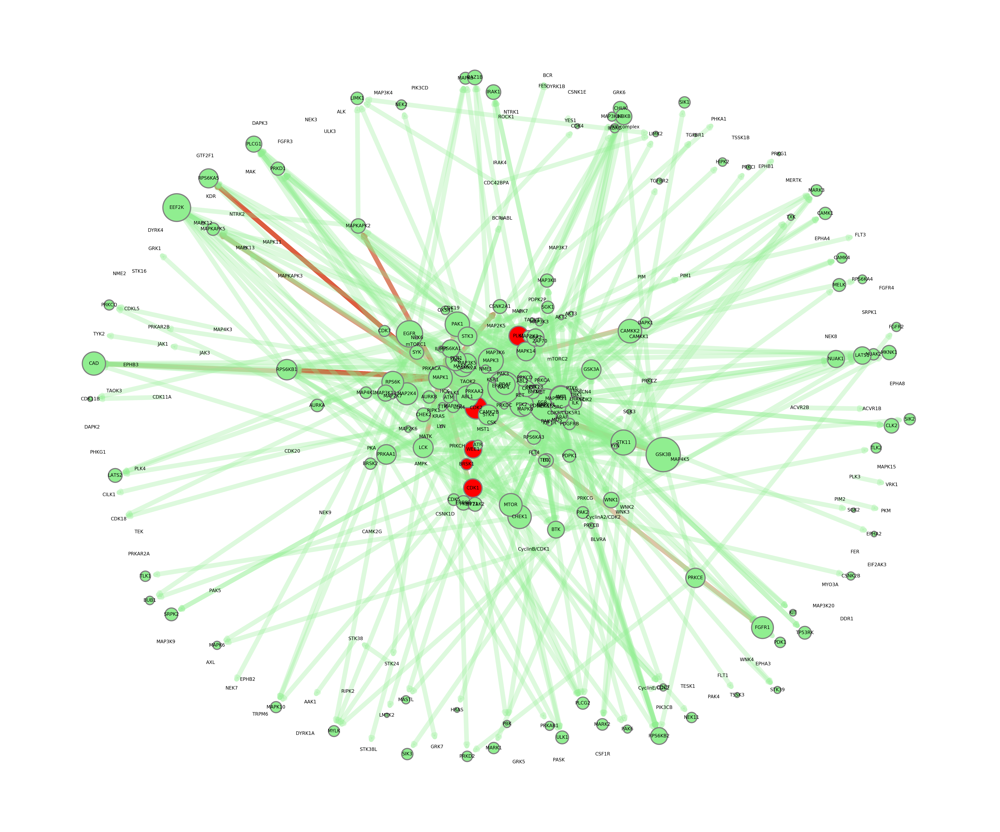

In [46]:
plt.figure(figsize=(24, 20), dpi=300)

pos = nx.spring_layout(mapk1, seed=1)  # positions for all nodes

# nodes
# node color according to residue : (H, red), (S, blue), (T, green), (Y, orange)
nx.draw_networkx_nodes(wee1, pos, nodelist=with_nodes, node_size=with_size, node_color='red',\
                      edgecolors='gray', linewidths=2, alpha=1)
nx.draw_networkx_nodes(wee1, pos, nodelist=without_nodes, node_size=without_size, node_color='lightgreen',\
                      edgecolors='gray', linewidths=2, alpha=1)

# edges
nx.draw_networkx_edges(wee1, pos, edgelist=mapk1_edges, width=8, alpha=0.3, edge_color="red")
nx.draw_networkx_edges(wee1, pos, width=8, alpha=0.3, edge_color="lightgreen")

# edge color according to number of edges: (#edges==1,red), (2<=#edges<=10,green), (#edges>10,blue)
#nx.draw_networkx_edges(G, pos, edgelist=a, width=8, alpha=0.5, edge_color="tab:red")
#nx.draw_networkx_edges(G, pos, edgelist=b, width=8, alpha=0.5, edge_color="tab:green")
#nx.draw_networkx_edges(G, pos, edgelist=c, width=8, alpha=0.5, edge_color="tab:blue")

nx.draw_networkx_labels(wee1, pos, font_size=8, font_color="black")

plt.tight_layout()
plt.axis("off")
plt.show()

In [47]:
"""plt.figure(figsize=(24, 20), dpi=300)

pos = nx.spring_layout(Q, seed=1)  # positions for all nodes

# nodes
# node color according to residue : (H, red), (S, blue), (T, green), (Y, orange)
options = {"edgecolors": "black", "node_size": 3000, "alpha": 0.5}
nx.draw_networkx_nodes(Q, pos, nodelist=n, node_color="red", **options)
nx.draw_networkx_nodes(Q, pos, nodelist=nodelist, node_size=node_size, node_color=node_color,\
                      edgecolors='gray', linewidths=2, alpha=1)

# edges
nx.draw_networkx_edges(Q, pos, edgelist=edgelist, width=10, alpha=0.5, edge_color="red")
nx.draw_networkx_edges(Q, pos, width=8, alpha=0.3, edge_color="grey")

# edge color according to number of edges: (#edges==1,red), (2<=#edges<=10,green), (#edges>10,blue)
#nx.draw_networkx_edges(G, pos, edgelist=a, width=8, alpha=0.5, edge_color="tab:red")
#nx.draw_networkx_edges(G, pos, edgelist=b, width=8, alpha=0.5, edge_color="tab:green")
#nx.draw_networkx_edges(G, pos, edgelist=c, width=8, alpha=0.5, edge_color="tab:blue")

nx.draw_networkx_labels(Q, pos, font_size=6, font_color="black")

plt.tight_layout()
plt.axis("off")
plt.show()"""
print()

## (c)

In [48]:
f = df.copy()

In [49]:
edgelist = []

for i, t, k, p, r in zip(f.index, f.Target, f.Kinase, f.Position, f.Residue):
    if t == 'AKT1' and p == 474 and r == 'Y':
        q.loc[[i], 'Residue'] = 'F'
        edgelist.append((k, t))

In [50]:
if edgelist:
    print(edgelist)
else:
    print("No such information is found in the dataset.")

No such information is found in the dataset.
